# Atividade Computacional: Fundamentos de Processamento de Imagens
### Visão Computacional | TIC43 - Básico

**Aluno:** Fabiano Amaral Alves

#### Instalação de dependencias necessarias para execução das tarefas

In [3]:

!pip install -q matplotlib
!pip install -q opencv-python

print("Dependencias instaladas!")

Dependencias instaladas!


In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

print("Tudo OK!")
print("Bibliotecas importadas!")


Tudo OK!
Bibliotecas importadas!


In [28]:
def get_caminho_output(nome_arquivo: str, nome_pasta: str = "output") -> str:
    if not os.path.exists(nome_pasta):
        os.makedirs(nome_pasta)
    return os.path.join(nome_pasta, nome_arquivo)

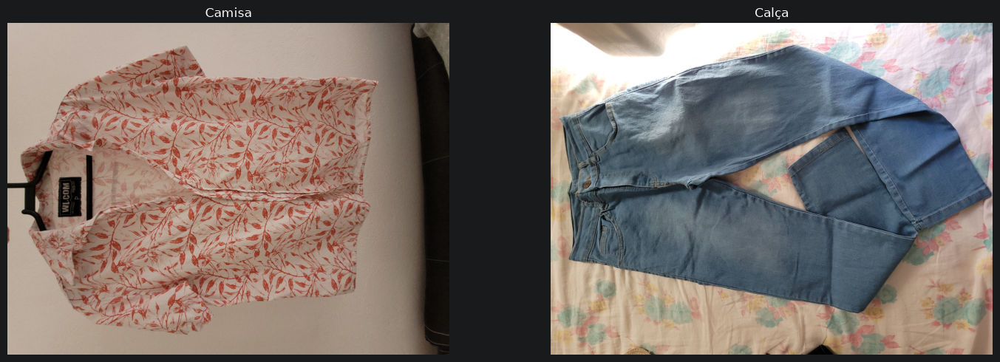

In [5]:
imagem_camisa_rgb = np.array(Image.open("dataset/camisa/20260831_095106.jpg"))
imagem_calca_rgb = np.array(Image.open("dataset/calca/20260831_100435.jpg"))

fig, eixos = plt.subplots(1, 2, figsize=(15, 5))
eixos[0].imshow(imagem_camisa_rgb)
eixos[0].set_title("Camisa")
eixos[0].axis("off")
eixos[1].imshow(imagem_calca_rgb)
eixos[1].set_title("Calça")
eixos[1].axis("off")
plt.tight_layout()
plt.show()

#### Analise de Resolução

**Classe Camisa:** Versão Original -> Redução da resolução em 50% -> Redução da resolução em 80%

**Classe Calça:** Versão Original -> Redução da resolução em 50% -> Redução da resolução em 80%

In [7]:
def modifica_resolucao(imagem: np.ndarray, proporcao: int, classe: str):
    altura, largura = imagem.shape[:2]
    print(f"***** Classe {classe} *****")
    print(f"A imagem original possui {altura}px de altura e {largura}px de largura.")
    print("-----------------------------------------------")
    porcentagem = np.round(100//proporcao).astype(int) # mostra a porcentagem da redução de resulução
    print(f"Redução da resulução para {porcentagem}% da resulução original!")
    altura_reduzida = altura // proporcao
    largura_reduzida = largura // proporcao

    imagem_reduzida = cv2.resize(imagem, (largura_reduzida, altura_reduzida), interpolation=cv2.INTER_AREA)
    print(f"A imagem reduzida para {porcentagem}% da resulução original possui {imagem_reduzida.shape[0]}px de altura e {imagem_reduzida.shape[1]}px de largura.")
    print(f"----------------------------------------------------------\n")
    imagem_reampliada = cv2.resize(imagem_reduzida, (largura, altura), interpolation=cv2.INTER_NEAREST)

    return imagem_reduzida, imagem_reampliada


***** Classe Camisa *****
A imagem original possui 3000px de altura e 4000px de largura.
-----------------------------------------------
Redução da resulução para 50% da resulução original!
A imagem reduzida para 50% da resulução original possui 1500px de altura e 2000px de largura.
----------------------------------------------------------

***** Classe Camisa *****
A imagem original possui 3000px de altura e 4000px de largura.
-----------------------------------------------
Redução da resulução para 20% da resulução original!
A imagem reduzida para 20% da resulução original possui 600px de altura e 800px de largura.
----------------------------------------------------------

***** Classe Camisa *****
A imagem original possui 3000px de altura e 4000px de largura.
-----------------------------------------------
Redução da resulução para 10% da resulução original!
A imagem reduzida para 10% da resulução original possui 300px de altura e 400px de largura.
--------------------------------

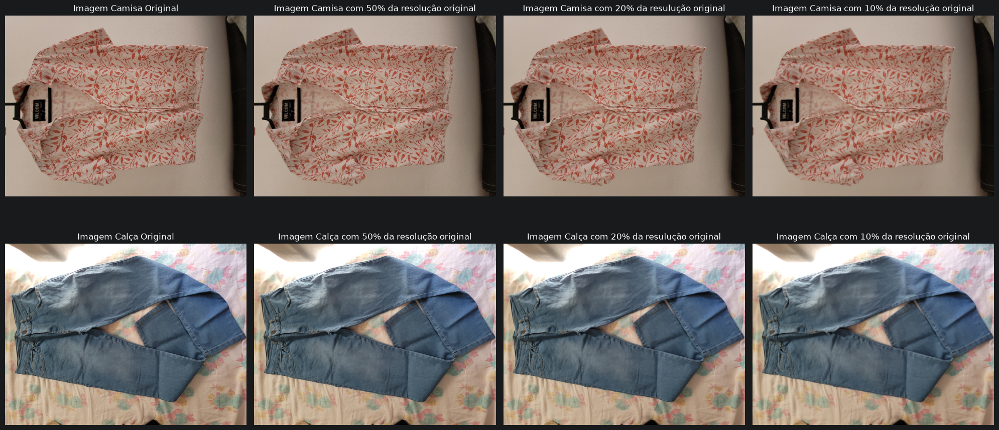

In [8]:
# Proporção 2 = 50%, pois 100 / 2 = 50
# Proporção 5 = 20%, pois 100 / 5 = 20
# Como a resolução original das imagens é bastante alta, testaremos com 10% da resolução original

'''Para Classe Camisa'''
imagem_camisa_reduzida_50, imagem_camisa_reampliada_50 = modifica_resolucao(imagem_camisa_rgb, 2, classe="Camisa")
imagem_camisa_reduzida_20, imagem_camisa_reampliada_20 = modifica_resolucao(imagem_camisa_rgb, 5, classe="Camisa")
imagem_camisa_reduzida_10, imagem_camisa_reampliada_10 = modifica_resolucao(imagem_camisa_rgb, 10, classe="Camisa")

'''Para Classe Calça'''
imagem_calca_reduzida_50, imagem_calca_reampliada_50 = modifica_resolucao(imagem_calca_rgb, 2, classe="Calça")
imagem_calca_reduzida_20, imagem_calca_reampliada_20 = modifica_resolucao(imagem_calca_rgb, 5, classe="Calça")
imagem_calca_reduzida_10, imagem_calca_reampliada_10 = modifica_resolucao(imagem_calca_rgb, 10, classe="Calça")


fig, eixos = plt.subplots(2, 4, figsize=(20, 10))
eixos[0,0].imshow(imagem_camisa_rgb)
eixos[0,0].set_title("Imagem Camisa Original")
eixos[0,0].axis("off")
eixos[0,1].imshow(imagem_camisa_reampliada_50)
eixos[0,1].set_title("Imagem Camisa com 50% da resolução original")
eixos[0,1].axis("off")
eixos[0,2].imshow(imagem_camisa_reampliada_20)
eixos[0,2].set_title("Imagem Camisa com 20% da resulução original")
eixos[0,2].axis("off")
eixos[0,3].imshow(imagem_camisa_reampliada_10)
eixos[0,3].set_title("Imagem Camisa com 10% da resolução original")
eixos[0,3].axis("off")
eixos[1,0].imshow(imagem_calca_rgb)
eixos[1,0].set_title("Imagem Calça Original")
eixos[1,0].axis("off")
eixos[1,1].imshow(imagem_calca_reampliada_50)
eixos[1,1].set_title("Imagem Calça com 50% da resolução original")
eixos[1,1].axis("off")
eixos[1,2].imshow(imagem_calca_reampliada_20)
eixos[1,2].set_title("Imagem Calça com 20% da resulução original")
eixos[1,2].axis("off")
eixos[1,3].imshow(imagem_calca_reampliada_10)
eixos[1,3].set_title("Imagem Calça com 10% da resolução original")
eixos[1,3].axis("off")
plt.tight_layout()
plt.show()

### Espaços de Cor

Exemplo RGB, HSV e Escala de Cinza para cada classe.

Camisa: RGB -> HSV -> Escala de Cinza

Calça: RGB -> HSV -> Escala de Cinza



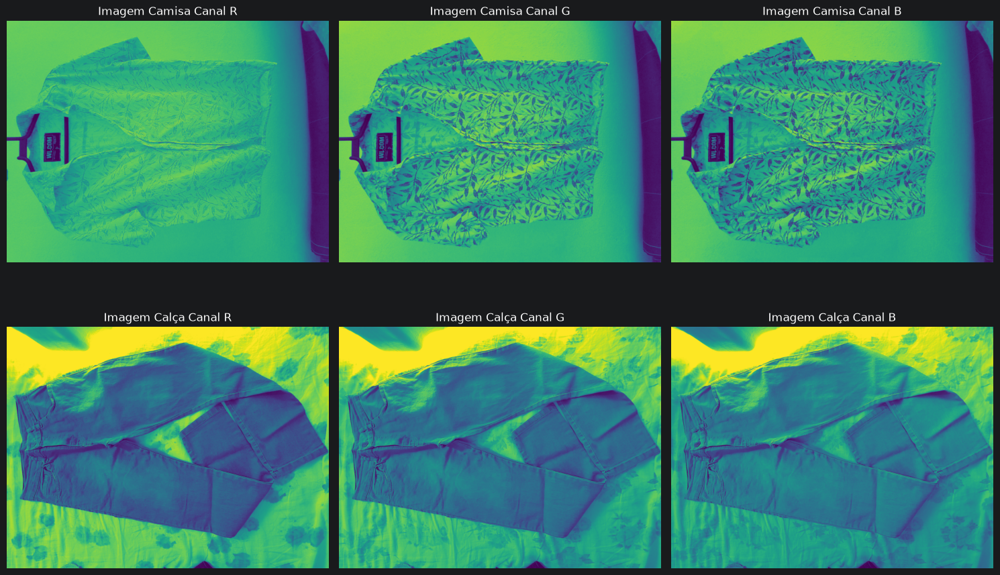

In [9]:
'''RGB Classe Camisa'''

canal_r_camisa = imagem_camisa_rgb[:,:, 0]
canal_g_camisa = imagem_camisa_rgb[:,:, 1]
canal_b_camisa = imagem_camisa_rgb[:,:, 2]

'''RGB Classe Calça'''

canal_r_calca = imagem_calca_rgb[:,:, 0]
canal_g_calca = imagem_calca_rgb[:,:, 1]
canal_b_calca = imagem_calca_rgb[:,:, 2]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
eixos[0,0].imshow(canal_r_camisa)
eixos[0,0].set_title("Imagem Camisa Canal R")
eixos[0,0].axis("off")
eixos[0,1].imshow(canal_g_camisa)
eixos[0,1].set_title("Imagem Camisa Canal G")
eixos[0,1].axis("off")
eixos[0,2].imshow(canal_b_camisa)
eixos[0,2].set_title("Imagem Camisa Canal B")
eixos[0,2].axis("off")
eixos[1,0].imshow(canal_r_calca)
eixos[1,0].set_title("Imagem Calça Canal R")
eixos[1,0].axis("off")
eixos[1,1].imshow(canal_g_calca)
eixos[1,1].set_title("Imagem Calça Canal G")
eixos[1,1].axis("off")
eixos[1,2].imshow(canal_b_calca)
eixos[1,2].set_title("Imagem Calça Canal B")
eixos[1,2].axis("off")



plt.tight_layout()
plt.show()

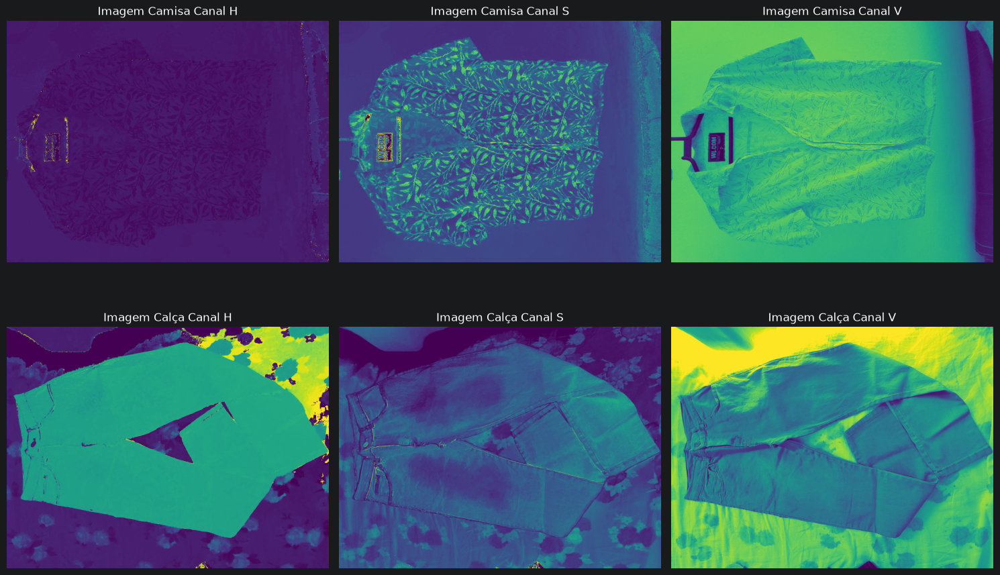

In [10]:
'''HSV Classe Camisa'''

imagem_camisa_hsv = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2HSV)
canal_h_camisa = imagem_camisa_hsv[:,:,0]
canal_s_camisa = imagem_camisa_hsv[:,:,1]
canal_v_camisa = imagem_camisa_hsv[:,:,2]

'''HSV Classe Calça'''
imagem_calca_hsv = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2HSV)
canal_h_calca = imagem_calca_hsv[:,:,0]
canal_s_calca = imagem_calca_hsv[:,:,1]
canal_v_calca = imagem_calca_hsv[:,:,2]

fig, eixos = plt.subplots(2, 3, figsize=(15, 10))
eixos[0,0].imshow(canal_h_camisa)
eixos[0,0].set_title("Imagem Camisa Canal H")
eixos[0,0].axis("off")
eixos[0,1].imshow(canal_s_camisa)
eixos[0,1].set_title("Imagem Camisa Canal S")
eixos[0,1].axis("off")
eixos[0,2].imshow(canal_v_camisa)
eixos[0,2].set_title("Imagem Camisa Canal V")
eixos[0,2].axis("off")
eixos[1,0].imshow(canal_h_calca)
eixos[1,0].set_title("Imagem Calça Canal H")
eixos[1,0].axis("off")
eixos[1,1].imshow(canal_s_calca)
eixos[1,1].set_title("Imagem Calça Canal S")
eixos[1,1].axis("off")
eixos[1,2].imshow(canal_v_calca)
eixos[1,2].set_title("Imagem Calça Canal V")
eixos[1,2].axis("off")
plt.tight_layout()
plt.show()


Shape Imagem Camisa em RGB:  (3000, 4000, 3)
Shape Imagem Camisa em Escala de Cinza:  (3000, 4000)
Shape Imagem Calça em RGB:  (3024, 4032, 3)
Shape Imagem Calça em Escala de Cinza:  (3024, 4032)


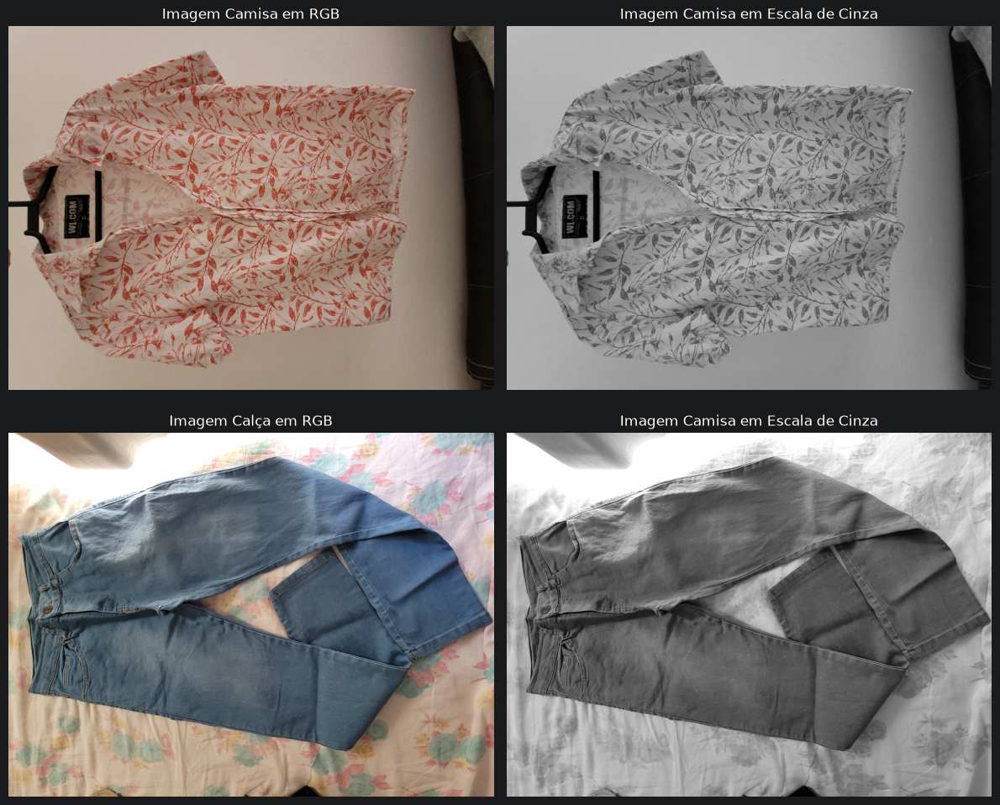

In [11]:
'''Escala de Cinza Classe Camisa'''
imagem_camisa_cinza = cv2.cvtColor(imagem_camisa_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Camisa em RGB: ", imagem_camisa_rgb.shape)
print("Shape Imagem Camisa em Escala de Cinza: ", imagem_camisa_cinza.shape)

'''Escala de Cinza Classe Calça'''
imagem_calca_cinza = cv2.cvtColor(imagem_calca_rgb, cv2.COLOR_RGB2GRAY)

print("Shape Imagem Calça em RGB: ", imagem_calca_rgb.shape)
print("Shape Imagem Calça em Escala de Cinza: ", imagem_calca_cinza.shape)

fig, eixos = plt.subplots(2, 2, figsize=(12, 10))
eixos[0,0].imshow(imagem_camisa_rgb)
eixos[0,0].set_title("Imagem Camisa em RGB")
eixos[0,0].axis("off")
eixos[0,1].imshow(imagem_camisa_cinza, cmap="gray", vmin=0, vmax=255)
eixos[0,1].set_title("Imagem Camisa em Escala de Cinza")
eixos[0,1].axis("off")
eixos[1,0].imshow(imagem_calca_rgb)
eixos[1,0].set_title("Imagem Calça em RGB")
eixos[1,0].axis("off")
eixos[1,1].imshow(imagem_calca_cinza, cmap="gray", vmin=0, vmax=255)
eixos[1,1].set_title("Imagem Camisa em Escala de Cinza")
eixos[1,1].axis("off")
plt.tight_layout()
plt.show()


### Quantização

Redução dos niveis de intensidade

Classe Camisa

Classe Calça

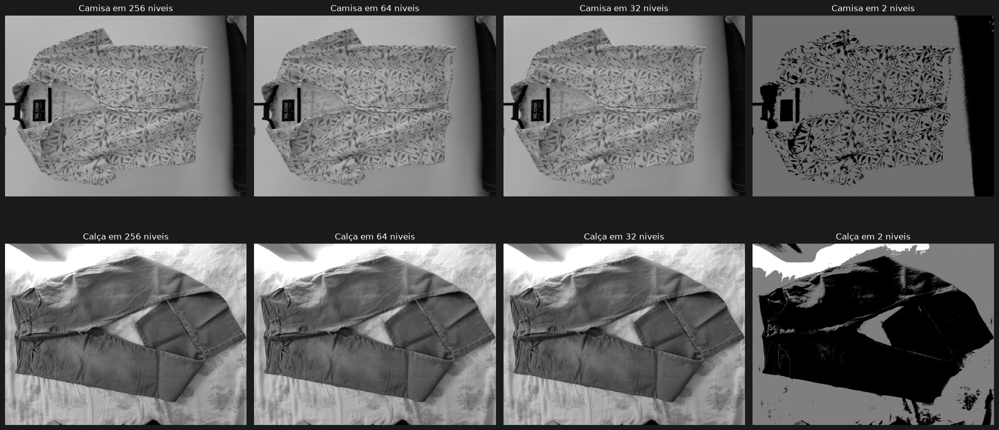

In [13]:
def quantizar_imagem(imagem: np.ndarray, niveis: int) -> np.ndarray:
    imagem_min, imagem_max = imagem.min(), imagem.max()
    passo = (imagem_min + imagem_max) / niveis
    resultado = np.floor((imagem - imagem_min) / passo) * passo + imagem_min
    return resultado.astype(np.uint8)

'''Classe Camisa'''
imagem_camisa_256 = quantizar_imagem(imagem_camisa_cinza, 256)
imagem_camisa_64 = quantizar_imagem(imagem_camisa_cinza, 64)
imagem_camisa_32 = quantizar_imagem(imagem_camisa_cinza, 32)
imagem_camisa_2 = quantizar_imagem(imagem_camisa_cinza, 2)

'''Classe Calça'''
imagem_calca_256 = quantizar_imagem(imagem_calca_cinza, 256)
imagem_calca_64 = quantizar_imagem(imagem_calca_cinza, 64)
imagem_calca_32 = quantizar_imagem(imagem_calca_cinza, 32)
imagem_calca_2 = quantizar_imagem(imagem_calca_cinza, 2)

fig, eixos = plt.subplots(2, 4, figsize=(20, 10))
eixos[0,0].imshow(imagem_camisa_256, cmap="gray", vmin=0, vmax=255)
eixos[0,0].set_title("Camisa em 256 niveis")
eixos[0,0].axis("off")
eixos[0,1].imshow(imagem_camisa_64, cmap="gray", vmin=0, vmax=255)
eixos[0,1].set_title("Camisa em 64 niveis")
eixos[0,1].axis("off")
eixos[0,2].imshow(imagem_camisa_32, cmap="gray", vmin=0, vmax=255)
eixos[0,2].set_title("Camisa em 32 niveis")
eixos[0,2].axis("off")
eixos[0,3].imshow(imagem_camisa_2, cmap="gray", vmin=0, vmax=255)
eixos[0,3].set_title("Camisa em 2 niveis")
eixos[0,3].axis("off")
eixos[1,0].imshow(imagem_calca_256, cmap="gray", vmin=0, vmax=255)
eixos[1,0].set_title("Calça em 256 niveis")
eixos[1,0].axis("off")
eixos[1,1].imshow(imagem_calca_64, cmap="gray", vmin=0, vmax=255)
eixos[1,1].set_title("Calça em 64 niveis")
eixos[1,1].axis("off")
eixos[1,2].imshow(imagem_calca_32, cmap="gray", vmin=0, vmax=255)
eixos[1,2].set_title("Calça em 32 niveis")
eixos[1,2].axis("off")
eixos[1,3].imshow(imagem_calca_2, cmap="gray", vmin=0, vmax=255)
eixos[1,3].set_title("Calça em 2 niveis")
eixos[1,3].axis("off")
plt.tight_layout()
plt.show()




### Formato de Arquivo

In [29]:
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.jpg"), format="JPEG", quality=95)
Image.fromarray(imagem_camisa_rgb).save(get_caminho_output("camisa_rgb.png") , format="PNG")
tamanho_jpeg = os.path.getsize(get_caminho_output("camisa_rgb.jpg"))
tamanho_png = os.path.getsize(get_caminho_output("camisa_rgb.png"))
print(f"Imagem JPEG: {tamanho_jpeg} bytes")
print(f"Imagem PNG: {tamanho_png} bytes")

Imagem JPEG: 3626748 bytes
Imagem PNG: 12984884 bytes
